<a href="https://colab.research.google.com/github/manu6521/Image_project/blob/main/CNN_LSTM_FINAL.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

import modules


In [ ]:
# I referred to this website for some data preprocessing steps
# https://www.analyticsvidhya.com/blog/2021/12/step-by-step-guide-to-build-image-caption-generator-using-deep-learning/

In [ ]:
# importing all the required libraries
import os
import pickle
import numpy as np
from tqdm.notebook import tqdm
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.preprocessing.image import load_img,img_to_array
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Model
from tensorflow.keras.utils import to_categorical,plot_model
from tensorflow.keras.layers import Input,LSTM,Dense,Embedding,Dropout,concatenate
from tensorflow.keras.layers import add
from tensorflow.keras.layers import Reshape
import pandas as pd
from google.colab import drive
import matplotlib.pyplot as plt
from nltk.translate.bleu_score import corpus_bleu


In [ ]:
pip install transformers torch torchvision

In [ ]:

!pip install pydot

In [ ]:
!pip install wordcloud


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 511.1/511.1 kB 3.3 MB/s eta 0:00:00


In [ ]:
# mounting drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
!mkdir -p /content/flickr_new


In [ ]:
# unzipping the dataset
!unzip '/content/drive/MyDrive/flicker/Flickr8k_Dataset.zip' -d /content/flickr_new


Streaming output truncated to the last 5000 lines.
  inflating: /content/flickr_new/__MACOSX/Flicker8k_Dataset/._342872408_04a2832a1b.jpg  
  inflating: /content/flickr_new/Flicker8k_Dataset/3429142249_d09a32e291.jpg  
  inflating: /content/flickr_new/__MACOSX/Flicker8k_Dataset/._3429142249_d09a32e291.jpg  
  inflating: /content/flickr_new/Flicker8k_Dataset/3429194423_98e911a101.jpg  
  inflating: /content/flickr_new/__MACOSX/Flicker8k_Dataset/._3429194423_98e911a101.jpg  
  inflating: /content/flickr_new/Flicker8k_Dataset/3429351222_17ae744daf.jpg  
  inflating: /content/flickr_new/__MACOSX/Flicker8k_Dataset/._3429351222_17ae744daf.jpg  
  inflating: /content/flickr_new/Flicker8k_Dataset/3429351964_531de1bf16.jpg  
  inflating: /content/flickr_new/__MACOSX/Flicker8k_Dataset/._3429351964_531de1bf16.jpg  
  inflating: /content/flickr_new/Flicker8k_Dataset/3429391520_930b153f94.jpg  
  inflating: /content/flickr_new/__MACOSX/Flicker8k_Dataset/._3429391520_930b153f94.jpg  
  inflating: /c

In [ ]:
# setting path to images and captions
dir_new = '/content/flickr_new/Flicker8k_Dataset/'
dir_cap = '/content/flickr_new/'

In [ ]:
#printing number of images
df = os.listdir(dir_new)
print(len(df))

8091


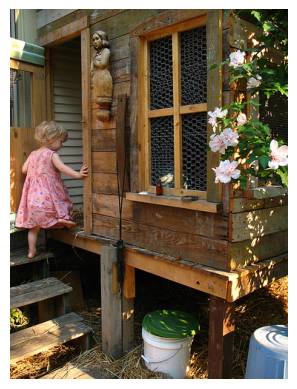

Image ID: 1000268201_693b08cb0e
Captions:
- start child in pink dress is climbing up set of stairs in an entry way end
- start girl going into wooden building end
- start little girl climbing into wooden playhouse end
- start little girl climbing the stairs to her playhouse end
- start little girl in pink dress going into wooden cabin end


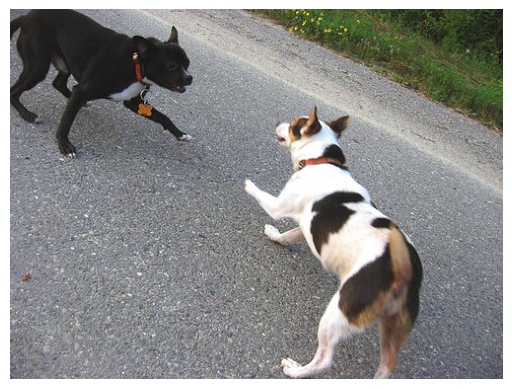

Image ID: 1001773457_577c3a7d70
Captions:
- start black dog and spotted dog are fighting end
- start black dog and tri-colored dog playing with each other on the road end
- start black dog and white dog with brown spots are staring at each other in the street end
- start two dogs of different breeds looking at each other on the road end
- start two dogs on pavement moving toward each other end


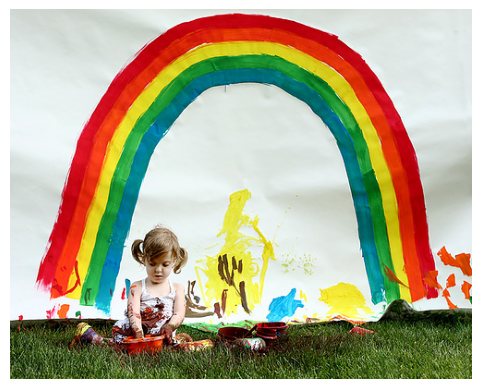

Image ID: 1002674143_1b742ab4b8
Captions:
- start little girl covered in paint sits in front of painted rainbow with her hands in bowl end
- start little girl is sitting in front of large painted rainbow end
- start small girl in the grass plays with fingerpaints in front of white canvas with rainbow on it end
- start there is girl with pigtails sitting in front of rainbow painting end
- start young girl with pigtails painting outside in the grass end


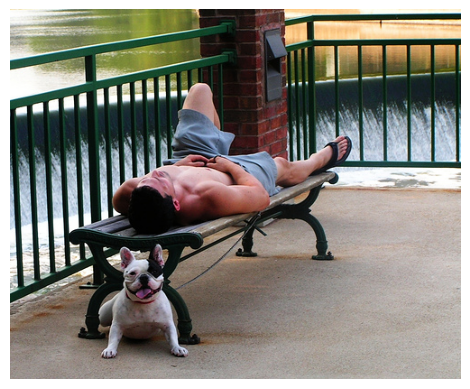

Image ID: 1003163366_44323f5815
Captions:
- start man lays on bench while his dog sits by him end
- start man lays on the bench to which white dog is also tied end
- start man sleeping on bench outside with white and black dog sitting next to him end
- start shirtless man lies on park bench with his dog end
- start man laying on bench holding leash of dog sitting on ground end


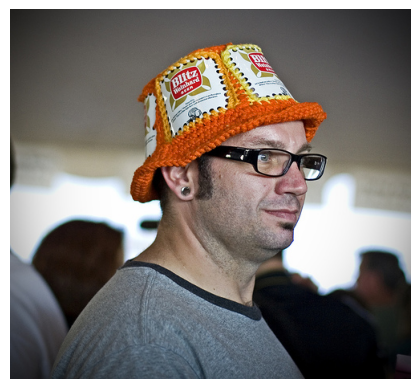

Image ID: 1007129816_e794419615
Captions:
- start man in an orange hat starring at something end
- start man wears an orange hat and glasses end
- start man with gauges and glasses is wearing blitz hat end
- start man with glasses is wearing beer can crocheted hat end
- start the man with pierced ears is wearing glasses and an orange hat end


In [ ]:
#Visualising sample images with their corresponding captions
from PIL import Image

image_dir = "/content/flickr_new/Flicker8k_Dataset/"

# Counter for the number of images displayed
image_count = 0
max_images = 5  # Set the number of images you want to display

# Iterate through the mapping dictionary
for image_id, captions in mapping.items():

    image_path = f"{image_dir}/{image_id}.jpg"

    try:
        img = Image.open(image_path)
        plt.imshow(img)
        plt.axis('off')
        plt.show()
        print(f"Image ID: {image_id}")
        print("Captions:")
        for caption in captions:
            print(f"- {caption}")
        image_count += 1
        if image_count >= max_images:
            break

    except FileNotFoundError:
        print(f"Image {image_id} not found in the directory.")


In [ ]:
# initializing
model = VGG16()
model = Model(inputs = model.inputs,outputs = model.layers[-2].output)
print(model.summary())


553467096/553467096 [==============================] - 2s 0us/step
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                            

In [ ]:
#  Obtain features
features = { }
for img_name in tqdm(os.listdir(dir_new)):
  #loading
  image_path = dir_new + '/' + img_name
  image = load_img(image_path, target_size=(224,224))
  #pixels to numpy
  image = img_to_array(image)
  image = image.reshape((1,image.shape[0],image.shape[1],image.shape[2]))
  #vgg16 preprocessing
  image = preprocess_input(image)
  feature = model.predict(image,verbose=0)
  #splitting
  image_id = img_name.split('.')[0]
  #save
  features[image_id] = feature

  0%|          | 0/8091 [00:00<?, ?it/s]

In [ ]:

#using pkl
pickle.dump(features, open(os.path.join(dir_new, 'ex_features.pkl'), 'wb'))

In [ ]:
# loading feature
with open(os.path.join(dir_new, 'ex_features.pkl'), 'rb') as f:
  ex_features = pickle.load(f)


In [ ]:
#unzipping
!unzip '/content/drive/MyDrive/captions.txt.zip' -d /content/flickr_new

Archive:  /content/drive/MyDrive/captions.txt.zip
  inflating: /content/flickr_new/captions.txt  


In [ ]:
# reading captions
with open(os.path.join(dir_cap, 'captions.txt'), 'r') as f:
  next(f)
  captions_doc = f.read()

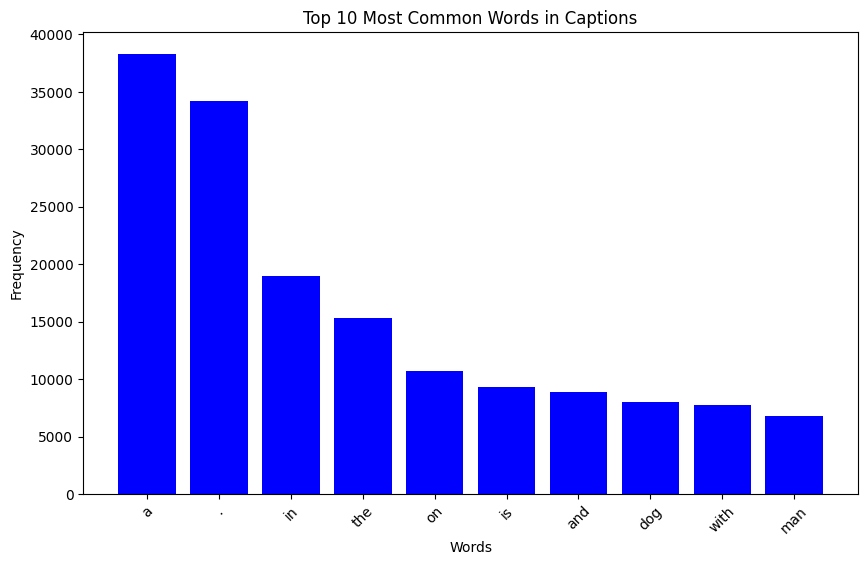

In [ ]:
#Printing most common words in captions
from collections import Counter

def load_captions(directory):
    captions = []
    for filename in os.listdir(directory):
        if filename.endswith(".txt"):
            with open(os.path.join(directory, filename), 'r') as file:
                captions.extend(file.readlines())
    return captions

def tokenize_captions(captions):
    words = []
    for caption in captions:
        words.extend(caption.split())
    return words

def plot_most_common_words(directory, num_words=10):
    # Load and tokenize captions
    captions = load_captions(directory)
    words = tokenize_captions(captions)

    # Count
    word_counts = Counter(words)


    most_common = word_counts.most_common(num_words)
    words, counts = zip(*most_common)

    # most common words
    plt.figure(figsize=(10, 6))
    plt.bar(words, counts, color='blue')
    plt.xlabel('Words')
    plt.ylabel('Frequency')
    plt.title(f'Top {num_words} Most Common Words in Captions')
    plt.xticks(rotation=45)
    plt.show()

# Directory containing the caption files
caption_directory = '/content/flickr_new/'

# Display most used words
plot_most_common_words(caption_directory, num_words=10)


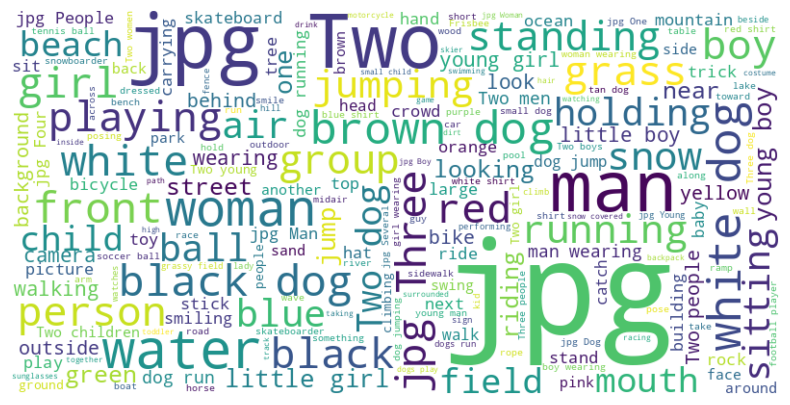

In [ ]:
from wordcloud import WordCloud

def plot_word_cloud(directory):
    # Load and tokenize captions
    captions = load_captions(dir_cap)
    words = tokenize_captions(captions)

    # calling cloud word
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(words))
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.show()

# Display the cloud_word
plot_word_cloud(caption_directory)


In [ ]:
#image_map
mapping = { }
for line in tqdm(captions_doc.split('\n')):
#spliting
  tokens = line.split(',')
  if len(line)<2:
    continue
  image_id, caption = tokens[0], tokens[1:]
  #jpg removal
  image_id = image_id.split('.')[0]
  caption = " ".join(caption)
  if image_id not in mapping:
    mapping[image_id] = []
  mapping[image_id].append(caption)

print(mapping[image_id])

  0%|          | 0/40456 [00:00<?, ?it/s]

['A man in a pink shirt climbs a rock face', 'A man is rock climbing high in the air .', 'A person in a red shirt climbing up a rock face covered in assist handles .', 'A rock climber in a red shirt .', 'A rock climber practices on a rock climbing wall .']


In [ ]:
# preprocess
def clean_cap(mapping):
  for key, captions in mapping.items():
    for i in range(len(captions)):
      caption = captions[i]
      #convert to lowercase
      caption = caption.lower()
      # deleting special chars, digits
      caption = caption.replace('[^A-Za-z]','')
      # removing spaces
      caption = caption.replace('\s+',' ')
      # adding tag
      caption = " ".join([word for word in caption.split() if len(word)>1])
      caption = 'start ' + caption + ' end'
      captions[i] = caption




In [ ]:
# before cleaning
mapping['1000268201_693b08cb0e']

['A child in a pink dress is climbing up a set of stairs in an entry way .',
 'A girl going into a wooden building .',
 'A little girl climbing into a wooden playhouse .',
 'A little girl climbing the stairs to her playhouse .',
 'A little girl in a pink dress going into a wooden cabin .']

In [ ]:
# calling cleaning function
clean_cap(mapping)

In [ ]:
# after cleaning
mapping['1000268201_693b08cb0e']

['start child in pink dress is climbing up set of stairs in an entry way end',
 'start girl going into wooden building end',
 'start little girl climbing into wooden playhouse end',
 'start little girl climbing the stairs to her playhouse end',
 'start little girl in pink dress going into wooden cabin end']

In [ ]:
# saving all the caption single list
final_captions = []
for key in mapping:
  for caption in mapping[key]:
    final_captions.append(caption)

In [ ]:
# printing length of final caption
len(final_captions)

40455

In [ ]:
# text tokenization
tokenizer = Tokenizer()
tokenizer.fit_on_texts(final_captions)
vocab_size = len(tokenizer.word_index) + 1
print(vocab_size)

8483


In [ ]:
#findimg  length_max
length_max = max(len(caption.split()) for caption in final_captions)
length_max

35

## Train_test_split

In [ ]:

image_ids = list(mapping.keys())


In [ ]:
#Splitting dataset for train,test and validation
from sklearn.model_selection import train_test_split
train_keys, temp_keys = train_test_split(image_ids, test_size=0.3, random_state=42)
val_keys, test_keys = train_test_split(temp_keys, test_size=0.1, random_state=42)


In [ ]:
#printing length of train,test,validation
print('Length of train is ' + str(len(train_keys)))
print('Length of test is ' + str(len(test_keys)))
print('Length of val is ' + str(len(val_keys)))

Length of train is 5663
Length of test is 243
Length of val is 2185


In [ ]:
## Create generator to get data in batch

def data_generator(data_keys, mapping, features, tokenizer, max_length, vocab_size, batch_size):
    while True:
        X1, X2, y = [], [], []
        for key in data_keys:
            captions = mapping[key]
            for caption in captions:
                seq = tokenizer.texts_to_sequences([caption])[0]
                for i in range(1, len(seq)):
                    input_seq, output_seq = seq[:i], seq[i]
                    input_seq = pad_sequences([input_seq], maxlen=max_length)[0]
                    # One-hot encode
                    output_seq = to_categorical([output_seq], num_classes=vocab_size)[0]
                    # Store the sequences
                    X1.append(features[key][0])
                    X2.append(input_seq)
                    y.append(output_seq)
                    # Yielding batch
                    if len(X1) == batch_size:
                        yield [np.array(X1), np.array(X2)], np.array(y)
                        X1, X2, y = [], [], []



## CREATING MODEL

In [ ]:
#Defining the first input layer which process the pre-extracted


inputs1 = Input(shape=(4096,)) # Input layer
fe1 = Dropout(0.4)(inputs1)
fe2 = Dense(256, activation = 'relu')(fe1)

# Defining the second input layer, which process the text sequence (captions)
inputs2 = Input(shape = (length_max,))
se1 = Embedding(vocab_size, 256, mask_zero=True)(inputs2)
se2 = Dropout(0.4)(se1)
se3 = LSTM(256)(se2)

# Combining both layers
decoder1 = add([fe2, se3]) # Joining the outputs from both layers (image and text)
decoder2 = Dense(256,activation='relu')(decoder1)
outputs = Dense(vocab_size, activation='softmax')(decoder2)  # Fina layer

# Defining the model with two inputs (image features and text sequence)
model = Model(inputs=[inputs1,inputs2], outputs=outputs)

# Compiling  with categorical cross-entropy and Adam
model.compile(loss='categorical_crossentropy',optimizer='adam')

# Visualizing
plot_model(model, show_shapes=True)


You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


In [ ]:
# setting parameters
train_losses = []
val_losses = []

epochs = 30
batch_size = 64
train_steps = len(train_keys) // batch_size
val_steps = len(val_keys) // batch_size
test_steps = len(test_keys) // batch_size

In [ ]:
#model training and validation with data generators
train_generator = data_generator(train_keys, mapping, ex_features, tokenizer, length_max, vocab_size, batch_size)
val_generator = data_generator(val_keys, mapping, ex_features, tokenizer, length_max, vocab_size, batch_size)
test_generator = data_generator(test_keys, mapping, ex_features, tokenizer, length_max, vocab_size, batch_size)

# calling training
history = model.fit(train_generator, epochs=epochs, steps_per_epoch=train_steps, verbose=1,
                    validation_data=val_generator, validation_steps=val_steps)


Epoch 1/30
88/88 [==============================] - 16s 134ms/step - loss: 6.6395 - val_loss: 5.9118
Epoch 2/30
88/88 [==============================] - 10s 116ms/step - loss: 6.0335 - val_loss: 5.9895
Epoch 3/30
88/88 [==============================] - 10s 117ms/step - loss: 5.7024 - val_loss: 5.5512
Epoch 4/30
88/88 [==============================] - 10s 115ms/step - loss: 5.5143 - val_loss: 5.5334
Epoch 5/30
88/88 [==============================] - 10s 117ms/step - loss: 5.5082 - val_loss: 5.6471
Epoch 6/30
88/88 [==============================] - 10s 117ms/step - loss: 5.3373 - val_loss: 5.6370
Epoch 7/30
88/88 [==============================] - 10s 117ms/step - loss: 5.2822 - val_loss: 5.2159
Epoch 8/30
88/88 [==============================] - 10s 117ms/step - loss: 5.2639 - val_loss: 5.1297
Epoch 9/30
88/88 [==============================] - 10s 119ms/step - loss: 5.2555 - val_loss: 5.2559
Epoch 10/30
88/88 [==============================] - 10s 117ms/step - loss: 4.9339 - val_lo

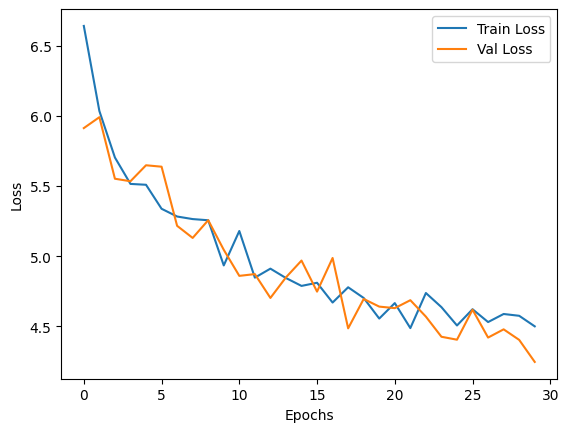

In [ ]:
# Plotting
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
#converting index to word
def ind_to_word(integer,tokenizer):
  for word,index in tokenizer.word_index.items():
    if index == integer:
      return word
  return None

In [ ]:
# generating captions
def predict_caption(model, image, tokenizer, length_max):
  in_text = 'start'
  for i in range(length_max):
    sequence = tokenizer.texts_to_sequences([in_text])[0]
    sequence = pad_sequences([sequence], length_max)
    yhat = model.predict([image, sequence], verbose=0)

    yhat = np.argmax(yhat)

    word = ind_to_word(yhat,tokenizer)
    if word is None:
      break

    in_text += " " + word
    if word == 'end':
      break
  return in_text





In [ ]:
pip install nltk


In [ ]:
import nltk
nltk.download('wordnet')
nltk.download('omw-1.4')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


True

In [ ]:
# calculating bleu score and meteor score
from nltk.translate.meteor_score import meteor_score
from tqdm import tqdm

# nltk data for sentence splitting is downloaded
nltk.download('punkt')

actual, predicted = list(), list()
meteor_scores = []

for key in tqdm(test_keys):
    captions = mapping[key]
    y_pred = predict_caption(model, ex_features[key], tokenizer, length_max)
    actual_captions = [caption.split() for caption in captions]
    y_pred = y_pred.split()
    actual.append(actual_captions)
    predicted.append(y_pred)

    # METEOR score for images
    for actual_caption in captions:
        # Tokenize both the reference and hypothesis
        tokenized_actual = actual_caption.split()
        tokenized_pred = y_pred

        score = meteor_score([tokenized_actual], tokenized_pred)
        meteor_scores.append(score)

#BLEU score
print("BLEU-1: %f" % corpus_bleu(actual, predicted, weights=(1.0, 0, 0, 0)))
print("BLEU-2: %f" % corpus_bleu(actual, predicted, weights=(0.5, 0.5, 0, 0)))
average_meteor_score = sum(meteor_scores) / len(meteor_scores)
print("Average METEOR Score: %f" % average_meteor_score)


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
100%|██████████| 243/243 [03:38<00:00,  1.11it/s]

BLEU-1: 0.478125
BLEU-2: 0.268632
Average METEOR Score: 0.225969


In [ ]:
!pip install gtts

In [ ]:
pip install googletrans==4.0.0-rc1

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.1/55.1 kB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.4/133.4 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.0/65.0 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 12.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.6/53.6 kB 2.7 MB/s eta 0:00:00
  Created wheel for googletrans: filename=googletrans-4.0.0rc1-py3-none-any.whl size=17397 sha256=314789fa589ee93ced8ba56a16c6acfbe6c964b86ce06a982c7ad4cf792c138a
  Stored in directory: /root/.cache/pip/wheels/c0/59/9f/7372f0cf70160fe61b528532e1a7c8498c4becd6bcffb022de
Successfully built googletrans
  Attempting uninstall: idna
    Found existing installation: idna 3.7
    Uninstalling idna-3.7:
      Success

In [ ]:
#visulaization and audio generation
from PIL import Image
from gtts import gTTS
from googletrans import Translator
from IPython.display import Audio, display

def generate_captions(image_name, language='en', speech_language='en'):
    # Initialize the translator
    translator = Translator()

    # Extraction
    image_id = image_name.split('.')[0]
    image_path = os.path.join(dir_new, image_name)
    image = Image.open(image_path)
    captions = mapping.get(image_id, [])

    # Generation
    y_pred = predict_caption(model, features[image_id], tokenizer, length_max)
    y_pred = y_pred.replace('start', '').replace('end', '').strip()

    # Translating the predicted caption to the desired language
    translated_caption = translator.translate(y_pred, dest=language).text

    print('+++Actual_Captions+++')
    print(captions[0].replace('start', '').replace('end', '').strip())

    # Display the translated caption
    print('+++Predicted_Captions+++')
    print(translated_caption)
    plt.imshow(image)
    plt.axis('off')
    plt.show()

    # Convert the translated caption to desired audio language
    tts = gTTS(text=translated_caption, lang=speech_language)

    # Save the audio to an MP3 file
    output_path = "Predicted_audio.mp3"
    tts.save(output_path)

    # Display and play the audio file in the notebook
    display(Audio(output_path, autoplay=True))



---------------------Actual---------------------
boy descs off the  of high diving board
...........Predicted.............
surfer in the water is in the water


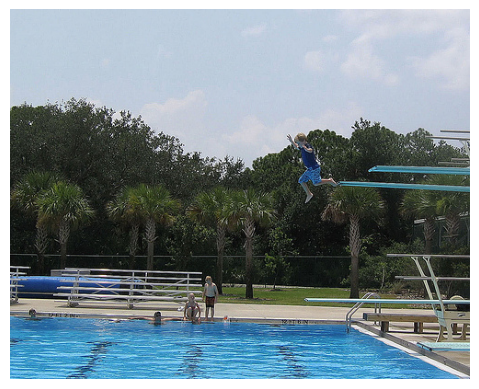

In [ ]:
generate_captions('1057089366_ca83da0877.jpg', language='en', speech_language='en')

---------------------Actual---------------------
brown dog chases the water from sprinkler on lawn
...........Predicted.............
Black Dog corre en la hierba


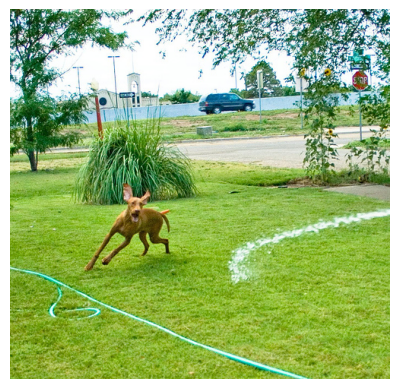

In [ ]:
generate_captions('1019077836_6fc9b15408.jpg', language='es', speech_language='es')

---------------------Actual---------------------
girl rides unicycle as another rides scooter next to her
...........Predicted.............
L'uomo in camicia rossa è seduto per strada


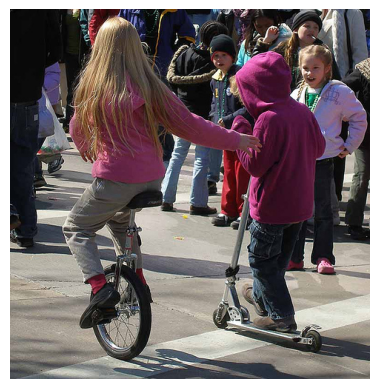

In [ ]:
generate_captions('1193116658_c0161c35b5.jpg', language='it', speech_language='it')

---------------------Actual---------------------
black and brown dog is laying on white shaggy carpet
...........Predicted.............
La niña está saltando en el agua


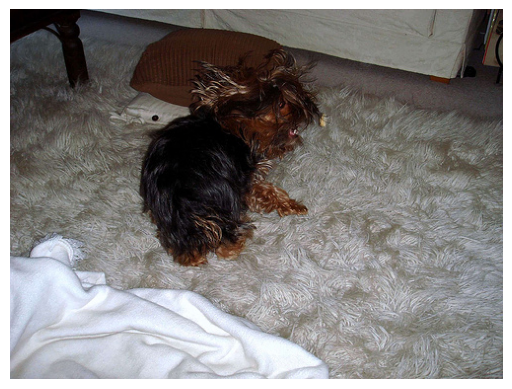

In [ ]:
generate_captions('1244140539_da4804d828.jpg', language='es', speech_language='es')

---------------------Actual---------------------
about 12 kids and few adults get splashed by an off camera source
...........Predicted.............
man in black shirt and black shirt and black shirt and black shirt and black shirt and black shirt


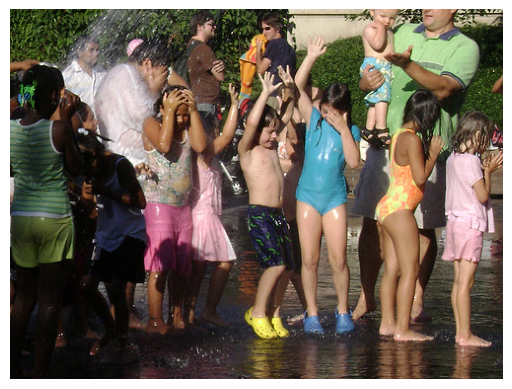

In [ ]:
generate_captions('1273001772_1585562051.jpg', language='en', speech_language='en')

---------------------Actual---------------------
big brown dog is jumping in the water and has his mouth wide open
...........Predicted.............
dog is running in the water


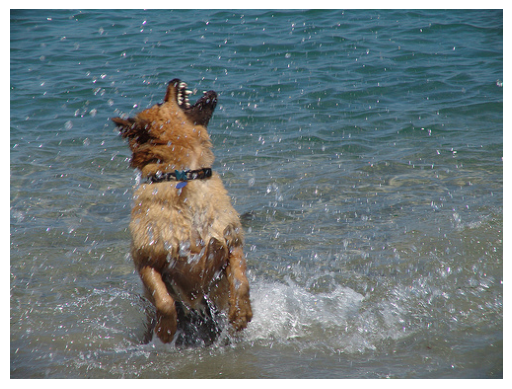

In [ ]:
generate_captions('1287982439_6578006e22.jpg', language='en', speech_language='en')

---------------------Actual---------------------
blonde fisherman standing in the water prepares his hook
...........Predicted.............
young girl in blue shirt is sitting on the water


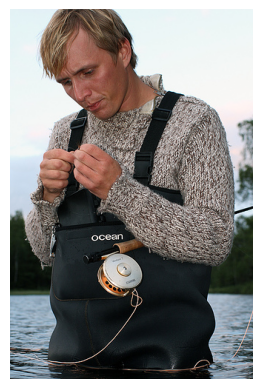

In [ ]:
generate_captions('937559727_ae2613cee5.jpg', language='en', speech_language='en')

---------------------Actual---------------------
man plays frisbee with his dog
...........Predicted.............
two people are playing in the air


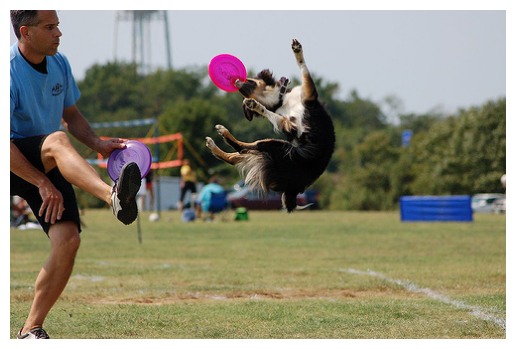

In [ ]:
generate_captions('1440024115_129212c988.jpg', language='en', speech_language='en')

---------------------Actual---------------------
boy chasing yellow ball
...........Predicted.............
boy in red shirt is playing in the air


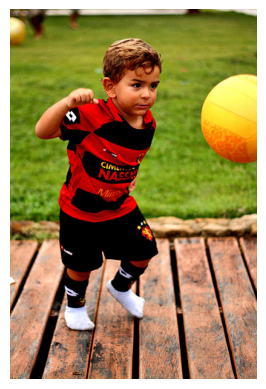

In [ ]:
generate_captions('3314180199_2121e80368.jpg', language='en', speech_language='en')

---------------------Actual---------------------
group of asian girls are standing together
...........Predicted.............
woman in black shirt and black shirt and black shirt and black shirt


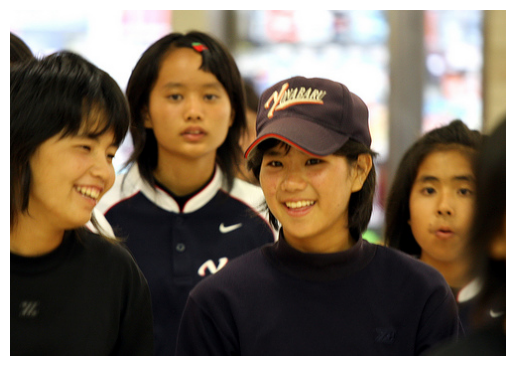

In [ ]:
generate_captions('3381788544_2c50e139dd.jpg', language='en', speech_language='en')

---------------------Actual---------------------
bicycler does trick in the air and his shadow is captured on the ceiling
...........Predicted.............
man in red shirt is jumping on the air


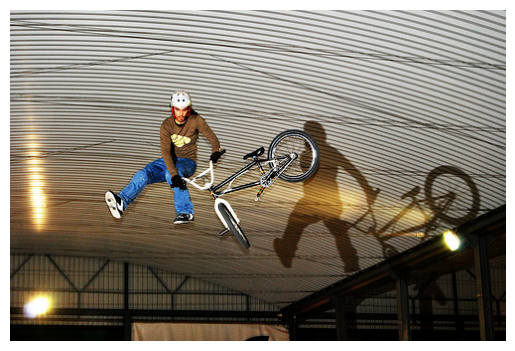

In [ ]:
generate_captions('3046286572_d2050ab0d9.jpg', language='en', speech_language='en')

---------------------Actual---------------------
man is climbing up wall
...........Predicted.............
man in red shirt is sitting on the water


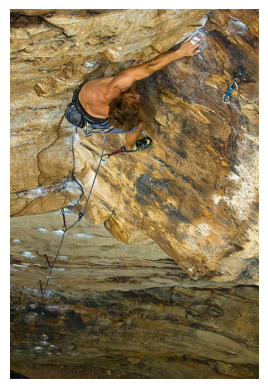

In [ ]:
generate_captions('1355450069_c0675b0706.jpg', language='en', speech_language='en')

---------------------Actual---------------------
girl hiking in front of waterfall
...........Predicted.............
the man in the shirt is in the water


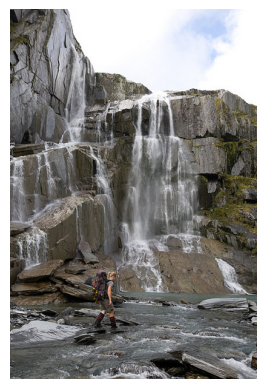

In [ ]:
generate_captions('2400958566_4e09424046.jpg', language='en', speech_language='en')

---------------------Actual---------------------
man in black shirt enjoys snack while woman in white shirt looks confused
...........Predicted.............
woman in blue shirt is sitting on the water


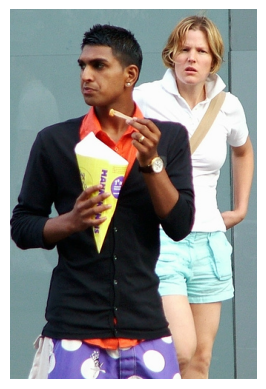

In [ ]:
generate_captions('930126921_1b94605bdc.jpg', language='en', speech_language='en')

---------------------Actual---------------------
group of people racing horses on beach
...........Predicted.............
two people are playing in the snow


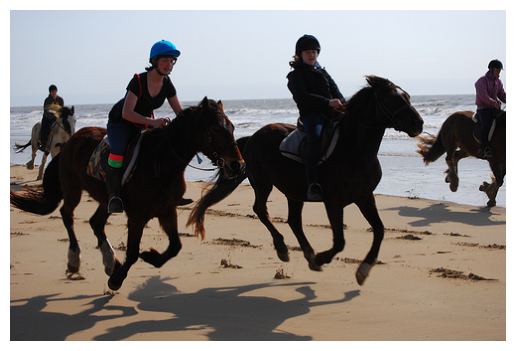

In [ ]:
generate_captions('3375534917_62350bd06b.jpg', language='en', speech_language='en')

---------------------Actual---------------------
deer and several turkeys together in the snow
...........Predicted.............
two dogs are running in the snow


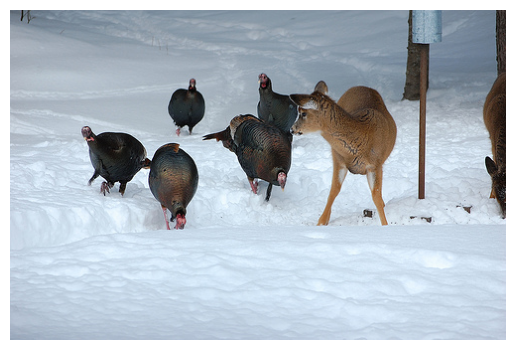

In [ ]:
generate_captions('3123770450_cedc16d162.jpg', language='en', speech_language='en')

---------------------Actual---------------------
people in red and pink walking down large steps
...........Predicted.............
man in red shirt is playing in the background


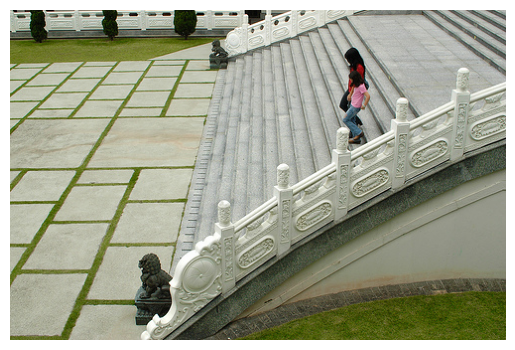

In [ ]:
generate_captions('2393971707_bce01ae754.jpg', language='en', speech_language='en')

---------------------Actual---------------------
brown dog is chasing ball on the grass
...........Predicted.............
black dog is running in the grass


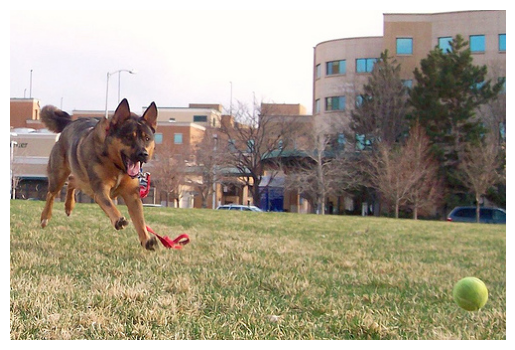

In [ ]:
generate_captions('3515358125_9e1d796244.jpg', language='en', speech_language='en')

---------------------Actual---------------------
lone snowboarder jumping on the side of snowy mountain
...........Predicted.............
man in red shirt is jumping on the snow


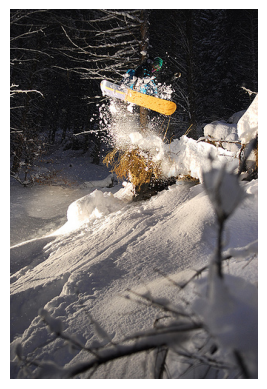

In [ ]:
generate_captions('3309042087_ee96d94b8a.jpg', language='en', speech_language='en')

---------------------Actual---------------------
brown number six race dog is slightly behind black race dog on track
...........Predicted.............
the dog is playing in the air


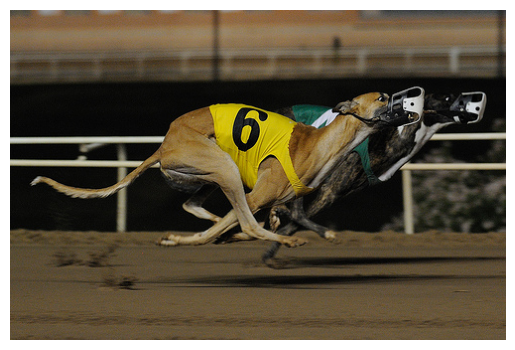

In [ ]:
generate_captions('2968182121_b3b491df85.jpg', language='en', speech_language='en')